In [3]:
import numpy as np
import math
import sys
import matplotlib.pyplot as plt

import tensorflow as tf
import tensorflow_hub as th

In [4]:
inception_v1_url = "https://tfhub.dev/google/imagenet/inception_v1/classification/4"

In [6]:
inception_v1_classifier = tf.keras.Sequential([th.KerasLayer(name='inception_v1', 
                                                             handle=inception_v1_url, 
                                                             trainable=False),])
inception_v1_classifier.build([None, 224, 224, 3])
inception_v1_classifier.summary()

2023-08-14 12:27:41.335433: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M1
2023-08-14 12:27:41.335458: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 16.00 GB
2023-08-14 12:27:41.335466: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 5.33 GB
2023-08-14 12:27:41.335500: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:303] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-08-14 12:27:41.335517: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:269] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v1 (KerasLayer)   (None, 1001)              6633209   
                                                                 
Total params: 6633209 (25.30 MB)
Trainable params: 0 (0.00 Byte)
Non-trainable params: 6633209 (25.30 MB)
_________________________________________________________________


In [8]:
def load_imagenet_labels(file_path):
  #"""
  #Args:
  #  file_path(str): A URL download path.
  #Returns:
  #  imagenet_label_array(numpy.ndarray): Array of strings with shape (1001,).
  #"""
    labels_file = tf.keras.utils.get_file('ImageNetLabels.txt', file_path)
    with open(labels_file, "r") as reader:
        f = reader.read()
        labels = f.splitlines()
        imagenet_label_array = np.array(labels)
    return imagenet_label_array

In [9]:
imagenet_label_vocab = load_imagenet_labels('https://storage.googleapis.com/download.tensorflow.org/data/ImageNetLabels.txt')

In [16]:
def parse_image(file_name):
    image = tf.io.read_file(file_name)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.convert_image_dtype(image, tf.float32)
    image = tf.image.resize(image, (224, 224), preserve_aspect_ratio=True)
    image = tf.image.resize_with_pad(image, target_height=224, target_width=224)
    return image

In [29]:
img_name_url = {
    #'Fireboat': 'https://storage.googleapis.com/applied-dl/temp/San_Francisco_fireboat_showing_off.jpg',
    'Fireboat': 'https://storage.googleapis.com/download.tensorflow.org/example_images/San_Francisco_fireboat_showing_off.jpg',
    #'School Bus': 'https://storage.googleapis.com/applied-dl/temp/Thomas_School_Bus_Bus.jpg',
    #'School Bus': 'https://storage.googleapis.com/download.tensorflow.org/example_images/Thomas_School_Bus_Bus.jpg',
    #'Giant Panda': 'https://storage.googleapis.com/applied-dl/temp/Giant_Panda_2.jpeg',
    'Giant Panda': 'https://storage.googleapis.com/download.tensorflow.org/example_images/Giant_Panda_2.jpeg',
    #'Black Beetle': 'https://storage.googleapis.com/applied-dl/temp/Lucanus.jpeg',
    #'Black Beetle': 'https://storage.googleapis.com/download.tensorflow.org/example_images/Lucanus.jpeg',
    #'Golden Retriever': 'https://storage.googleapis.com/applied-dl/temp/Golden_retriever.jpg',
    #'Golden Retriever': 'https://storage.googleapis.com/download.tensorflow.org/example_images/Golden_retriever.jpg',
    'Yellow Labrador Retriever': 'https://storage.googleapis.com/download.tensorflow.org/example_images/YellowLabradorLooking_new.jpg',
    'Military Uniform (Grace Hopper)': 'https://storage.googleapis.com/download.tensorflow.org/example_images/grace_hopper.jpg',
    #'Military Uniform (General Ulysses S. Grant)': 'https://storage.googleapis.com/applied-dl/temp/General_Ulysses_S._Grant%2C_Union_Army_(6186252896).jpg',
    #'Military Uniform (General Ulysses S. Grant)': 'https://storage.googleapis.com/download.tensorflow.org/example_images/General_Ulysses_S._Grant%2C_Union_Army_(6186252896).jpg',
    #'Military Uniform (Greek Presidential Guard)': 'https://storage.googleapis.com/applied-dl/temp/Greek_guard_uniforms_1.jpg',
    #'Military Uniform (Greek Presidential Guard)': 'https://storage.googleapis.com/download.tensorflow.org/example_images/Greek_guard_uniforms_1.jpg',
}

In [30]:
img_name_path = {name: tf.keras.utils.get_file(name, url) for (name, url) in img_name_url.items()}

In [31]:
img_name_tensors = {name: parse_image(img_path) for (name, img_path) in img_name_path.items()}

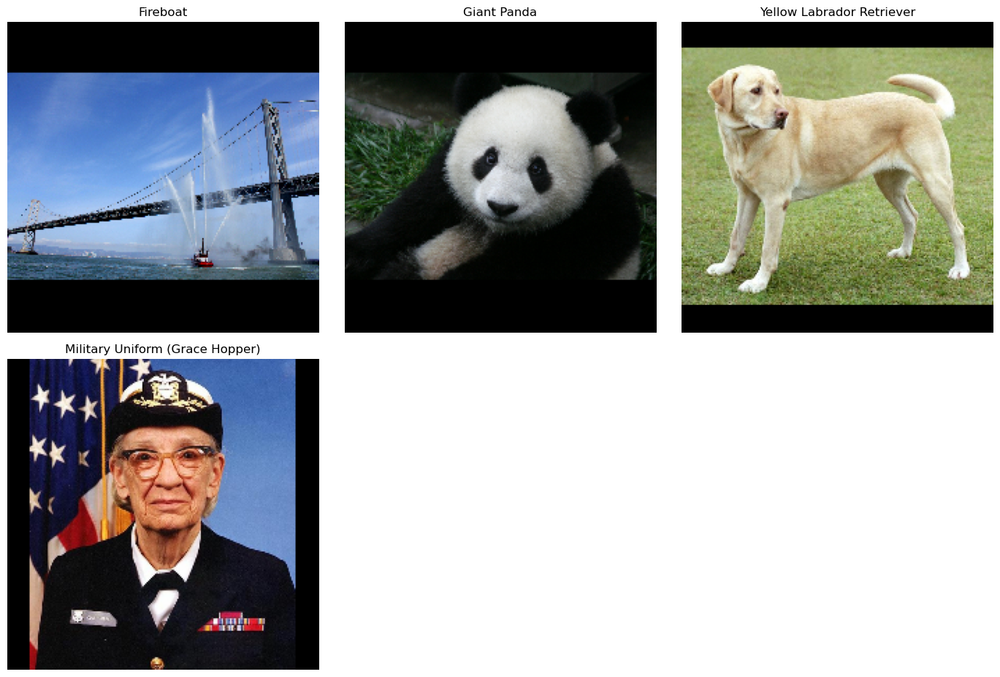

In [33]:
plt.figure(figsize=(14,14))
for n, (name, img_tensors) in enumerate(img_name_tensors.items()):
    ax = plt.subplot(3,3,n+1)
    ax.imshow(img_tensors)
    ax.set_title(name)
    ax.axis('off')
plt.tight_layout()

In [46]:
image_titles = tf.convert_to_tensor(list(img_name_tensors.keys()))
image_batch = tf.convert_to_tensor(list(img_name_tensors.values()))
image_batch.shape

TensorShape([4, 224, 224, 3])

In [47]:
image_titles

<tf.Tensor: shape=(4,), dtype=string, numpy=
array([b'Fireboat', b'Giant Panda', b'Yellow Labrador Retriever',
       b'Military Uniform (Grace Hopper)'], dtype=object)>

In [48]:
image_batch.shape

TensorShape([4, 224, 224, 3])

In [57]:
def top_k_predictions_scores_labels(model, img, label_vocab, top_k=3):
    """
  Args:
    model(tf.keras.Model): Trained Keras model.
    img(tf.Tensor): A 4D tensor of floats with the shape 
      (img_n, img_height, img_width, 3).
    label_vocab(numpy.ndarray): An array of strings with shape (1001,).
    top_k(int): Number of results to return.
  Returns:
    k_predictions_idx(tf.Tensor): A tf.Tensor [n_images, top_k] of tf.int32 
      prediction indicies.
    k_predictions_proba(tf.Tensor): A tf.Tensor [n_images, top_k] of tf.float32 
      prediction probabilities.
    k_predictions_label(tf.Tensor): A tf.Tensor [n_images, top_k] of tf.string 
      prediction labels.   
    """
  # These are logits (unnormalized scores).
    predictions = model(img)
  # Convert logits into probabilities.
    predictions_proba = tf.nn.softmax(predictions, axis=-1)
  # Filter top k prediction probabilities and indices.
    k_predictions_proba, k_predictions_idx = tf.math.top_k(
        input=predictions_proba, k=top_k)
  # Lookup top k prediction labels in label_vocab array.
    k_predictions_label = tf.convert_to_tensor(
        label_vocab[k_predictions_idx.numpy()], 
        dtype=tf.string)
    return k_predictions_idx, k_predictions_label, k_predictions_proba

In [59]:
def plot_img_predictions(model, img, img_titles, label_vocab, top_k=3):
    """Plot images with top_k predictions.
      Args:
        model(tf.keras.Model): Trained Keras model.
        img(Tensor): A 4D Tensor of floats with the shape 
          (img_n, img_height, img_width, 3).
        img_titles(Tensor): A Tensor of strings with the shape 
          (img_n, img_height, img_width, 3).
        label_vocab(numpy.ndarray): An array of strings with shape (1001,).
        top_k(int): Number of results to return.
      Returns:
        fig(matplotlib.pyplot.figure): fig object to utilize for displaying, saving 
          plots.
    """
    pred_idx, pred_label, pred_proba = top_k_predictions_scores_labels(
        model=model, img=img, label_vocab=label_vocab, top_k=top_k)
  
    img_arr = img.numpy()
    title_arr = img_titles.numpy()
    pred_idx_arr = pred_idx.numpy()
    pred_label_arr = pred_label.numpy()
    pred_proba_arr = pred_proba.numpy()

    n_rows = img_arr.shape[0]
    # Preserve image height by converting pixels to inches based on dpi.
    size = n_rows * (224 // 48)
    
    fig, axs = plt.subplots(nrows=img_arr.shape[0], ncols=1, figsize=(size, size), squeeze=False)
    for idx, image in enumerate(img_arr):
        axs[idx, 0].imshow(image)
        axs[idx, 0].set_title(title_arr[idx].decode('utf-8'), fontweight='bold')
        axs[idx, 0].axis('off')
        for k in range(top_k):
            k_idx = pred_idx_arr[idx][k]
            k_label = pred_label_arr[idx][k].decode('utf-8')
            k_proba = pred_proba_arr[idx][k]
            if k==0:
                s = 'Prediction {:}: ({:}-{:}) Score: {:.1%}'.format(k+1, k_idx, k_label, k_proba)
                axs[idx, 0].text(244 + size, 102+(k*40), s, fontsize=12, fontweight='bold')
            else:
                s = 'Prediction {:}: ({:}-{:}) Score: {:.1%}'.format(k+1, k_idx, k_label, k_proba)
                axs[idx, 0].text(244 + size, 102+(k*20), s, fontsize=12)
    plt.tight_layout()      
    return fig

2023-08-14 13:10:00.933392: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


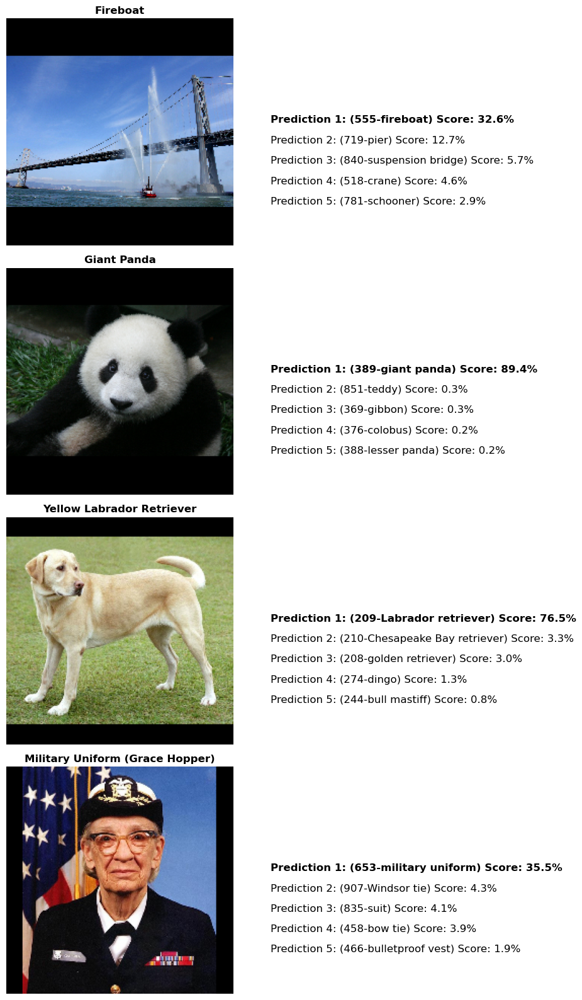

In [60]:
_ = plot_img_predictions(
    model=inception_v1_classifier,
    img=image_batch,
    img_titles=image_titles,
    label_vocab=imagenet_label_vocab, 
    top_k=5
    )

In [61]:
# name_baseline_tensors. Set random seed for reproducibility of random baseline image and associated attributions.
tf.random.set_seed(42)
name_baseline_tensors = {
    'Baseline Image: Black': tf.zeros(shape=(224,224,3)),
    'Baseline Image: Random': tf.random.uniform(shape=(224,224,3), minval=0.0, maxval=1.0),
    'Baseline Image: White': tf.ones(shape=(224,224,3)),
}

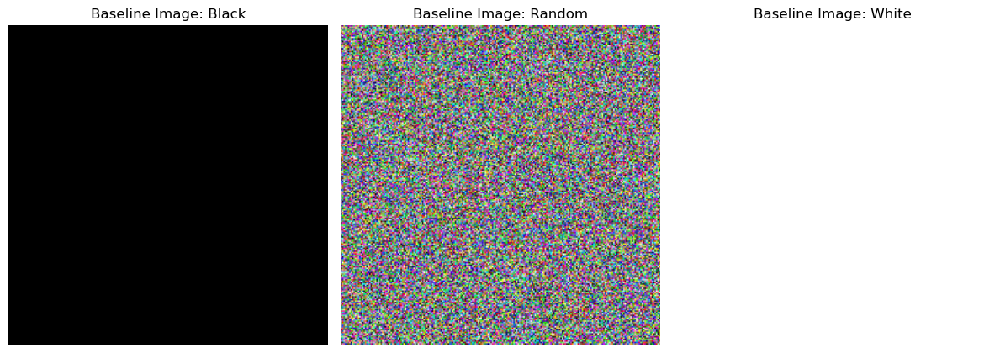

In [63]:
plt.figure(figsize=(12,12))
for n, (name, baseline_tensor) in enumerate(name_baseline_tensors.items()):
    ax = plt.subplot(1,3,n+1)
    ax.imshow(baseline_tensor)
    ax.set_title(name)
    ax.axis('off')
plt.tight_layout()

In [64]:
m_steps=20
alphas = tf.linspace(start=0.0, stop=1.0, num=m_steps+1)

In [65]:
def generate_path_inputs(baseline, input, alphas):
    """Generate m interpolated inputs between baseline and input features.
    Args:
      baseline(Tensor): A 3D image tensor of floats with the shape 
        (img_height, img_width, 3).
      input(Tensor): A 3D image tensor of floats with the shape 
        (img_height, img_width, 3).
      alphas(Tensor): A 1D tensor of uniformly spaced floats with the shape 
        (m_steps,).
    Returns:
      path_inputs(Tensor): A 4D tensor of floats with the shape 
        (m_steps, img_height, img_width, 3).
    """
    # Expand dimensions for vectorized computation of interpolations.
    alphas_x = alphas[:, tf.newaxis, tf.newaxis, tf.newaxis]
    baseline_x = tf.expand_dims(baseline, axis=0)
    input_x = tf.expand_dims(input, axis=0) 
    delta = input_x - baseline_x
    path_inputs = baseline_x +  alphas_x * delta
    
    return path_inputs

In [66]:
path_inputs = generate_path_inputs(
    baseline=name_baseline_tensors['Baseline Image: Black'], 
    input=img_name_tensors['Giant Panda'],
    alphas=alphas)

In [67]:
path_inputs.shape

TensorShape([21, 224, 224, 3])

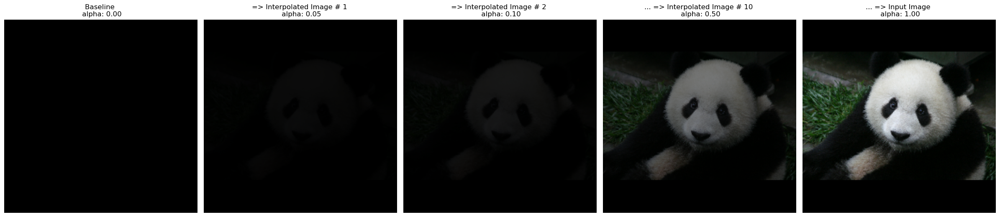

In [68]:
fig, axs = plt.subplots(nrows=1, ncols=5, squeeze=False, figsize=(24, 24))

axs[0,0].set_title('Baseline \n alpha: {:.2f}'.format(alphas[0]))
axs[0,0].imshow(path_inputs[0])
axs[0,0].axis('off')

axs[0,1].set_title('=> Interpolated Image # 1 \n alpha: {:.2f}'.format(alphas[1]))
axs[0,1].imshow(path_inputs[1])
axs[0,1].axis('off')

axs[0,2].set_title('=> Interpolated Image # 2 \n alpha: {:.2f}'.format(alphas[2]))
axs[0,2].imshow(path_inputs[2])
axs[0,2].axis('off')

axs[0,3].set_title('... => Interpolated Image # 10 \n alpha: {:.2f}'.format(alphas[10]))
axs[0,3].imshow(path_inputs[10])
axs[0,3].axis('off')

axs[0,4].set_title('... => Input Image \n alpha: {:.2f}'.format(alphas[-1]))
axs[0,4].imshow(path_inputs[-1])
axs[0,4].axis('off')

plt.tight_layout();

In [69]:
def compute_gradients(model, path_inputs, target_class_idx):
    """Compute gradients of model predicted probabilties with respect to inputs.
    Args:
      mode(tf.keras.Model): Trained Keras model.
      path_inputs(Tensor): A 4D tensor of floats with the shape 
        (m_steps, img_height, img_width, 3).
      target_class_idx(Tensor): A 0D tensor of an int corresponding to the correct
        ImageNet target class index.
    Returns:
      gradients(Tensor): A 4D tensor of floats with the shape 
        (m_steps, img_height, img_width, 3).
    """
    with tf.GradientTape() as tape:
        tape.watch(path_inputs)
        predictions = model(path_inputs)
        # Note: IG requires softmax probabilities; converting Inception V1 logits.
        outputs = tf.nn.softmax(predictions, axis=-1)[:, target_class_idx]      
    gradients = tape.gradient(outputs, path_inputs)

    return gradients

In [70]:
path_gradients = compute_gradients(
    model=inception_v1_classifier, 
    path_inputs=path_inputs, 
    target_class_idx=389)

2023-08-14 13:13:23.369974: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-08-14 13:13:24.524817: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


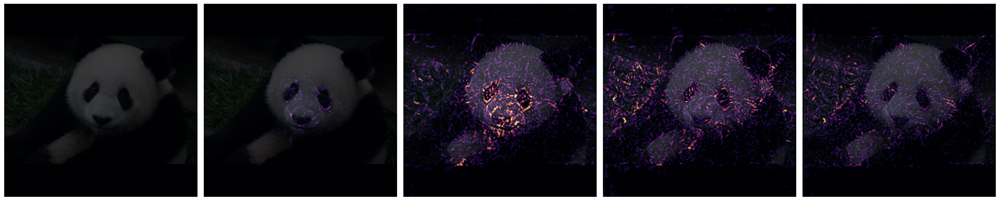

In [154]:
fig, axs = plt.subplots(nrows=1, ncols=5, squeeze=False, figsize=(24, 24))
for i in range(5):
    axs[0,i].imshow(np.array(tf.cast(255 * path_gradients[i], tf.uint8)).mean(2), cmap=plt.cm.inferno, vmin=0, vmax=45)
    #
    axs[0,i].imshow(path_inputs[-1], alpha=0.25)
    axs[0,i].axis('off')
plt.tight_layout()

2023-08-14 15:12:01.616683: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


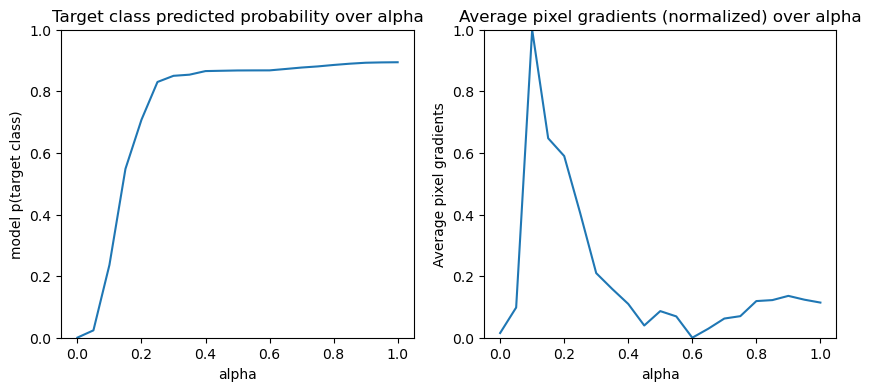

In [141]:
pred = inception_v1_classifier(path_inputs)
pred_proba = tf.nn.softmax(pred, axis=-1)[:, 389]

plt.figure(figsize=(10,4))
ax1 = plt.subplot(1,2,1)
ax1.plot(alphas, pred_proba)
ax1.set_title('Target class predicted probability over alpha')
ax1.set_ylabel('model p(target class)')
ax1.set_xlabel('alpha')
ax1.set_ylim([0,1])

ax2 = plt.subplot(1,2,2)
# Average across interpolation steps
average_grads = tf.math.reduce_mean(path_gradients, axis=[1,2,3])
# Normalize average gradients to 0 to 1 scale. E.g. (x - min(x))/(max(x)-min(x))
average_grads_norm = (average_grads-tf.math.reduce_min(average_grads))/(tf.math.reduce_max(average_grads)-tf.reduce_min(average_grads))
ax2.plot(alphas, average_grads_norm)
ax2.set_title('Average pixel gradients (normalized) over alpha')
ax2.set_ylabel('Average pixel gradients')
ax2.set_xlabel('alpha')
ax2.set_ylim([0,1]);

In [157]:
def plot_riemann_sums(fn, start_val, end_val, m_steps=10):
    """
    Plot Riemann Sum integral approximations for single variable functions.
    Args:
      fn(function): Any single variable function.
      start_val(int): Minimum function value constraint.
      end_val(int): Maximum function value constraint.
      m_steps(int): Linear interpolation steps for approximation.
    Returns:
      fig(matplotlib.pyplot.figure): fig object to utilize for displaying, saving 
        plots.
    """
    # fn plot args
    x = tf.linspace(start_val, end_val, m_steps**2+1)
    y = fn(x)

    fig = plt.figure(figsize=(16,4))

    # Left Riemann Sum
    lr_ax = plt.subplot(1,4,1)
    lr_ax.plot(x, y)
    lr_x = tf.linspace(0.0, 1.0, m_steps+1)
    lr_point = lr_x[:-1]
    lr_height = fn(lr_x[:-1])
    lr_ax.plot(lr_point, lr_height, 'b.', markersize=10)
    lr_ax.bar(lr_point, lr_height, width=(end_val-start_val)/m_steps, alpha=0.2, align='edge', edgecolor='b')
    lr_ax.set_title('Left Riemann Sum \n m_steps = {}'.format(m_steps))
    lr_ax.set_xlabel('alpha')
    # Right Riemann Sum
    rr_ax = plt.subplot(1,4,2)
    rr_ax.plot(x, y)
    rr_x = tf.linspace(0.0, 1.0, m_steps+1)
    rr_point = rr_x[1:]
    rr_height = fn(rr_x[1:])
    rr_ax.plot(rr_point, rr_height, 'b.', markersize=10)
    rr_ax.bar(rr_point, rr_height, width=-(end_val-start_val)/m_steps, alpha=0.2, align='edge', edgecolor='b')
    rr_ax.set_title('Right Riemann Sum \n m_steps = {}'.format(m_steps))
    rr_ax.set_xlabel('alpha')
    # Midpoint Riemann Sum
    mr_ax = plt.subplot(1,4,3)
    mr_ax.plot(x, y)
    mr_x = tf.linspace(0.0, 1.0, m_steps+1)
    mr_point = (mr_x[:-1] + mr_x[1:])/2
    mr_height = fn(mr_point)
    mr_ax.plot(mr_point, mr_height, 'b.', markersize=10)
    mr_ax.bar(mr_point, mr_height, width=(end_val-start_val)/m_steps, alpha=0.2, edgecolor='b')
    mr_ax.set_title('Midpoint Riemann Sum \n m_steps = {}'.format(m_steps))
    mr_ax.set_xlabel('alpha')
    # Trapezoidal Riemann Sum
    tp_ax = plt.subplot(1,4,4)
    tp_ax.plot(x, y)
    tp_x = tf.linspace(0.0, 1.0, m_steps+1)
    tp_y = fn(tp_x)
    for i in range(m_steps):
        xs = [tp_x[i], tp_x[i], tp_x[i+1], tp_x[i+1]]
        ys = [0, tp_y[i], tp_y[i+1], 0]
        tp_ax.plot(tp_x,tp_y,'b.',markersize=10)
        tp_ax.fill_between(xs, ys, color='C0', edgecolor='blue', alpha=0.2)
    tp_ax.set_title('Trapezoidal Riemann Sum \n m_steps = {}'.format(m_steps))
    tp_ax.set_xlabel('alpha')

    return fig

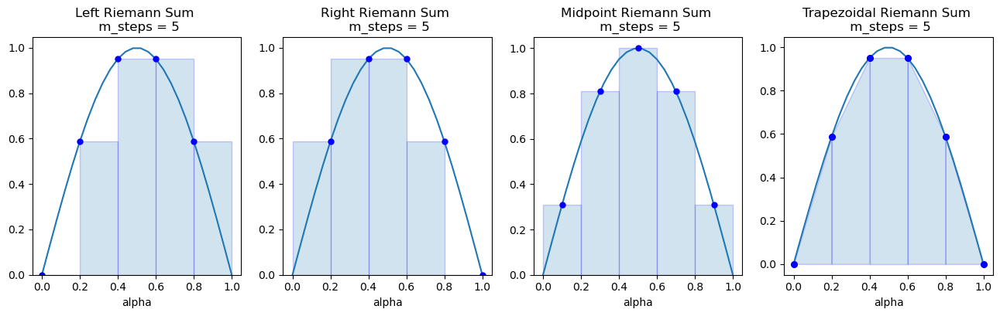

In [158]:
_ = plot_riemann_sums(lambda x: tf.math.sin(x*math.pi), 0.0, 1.0, m_steps=5)

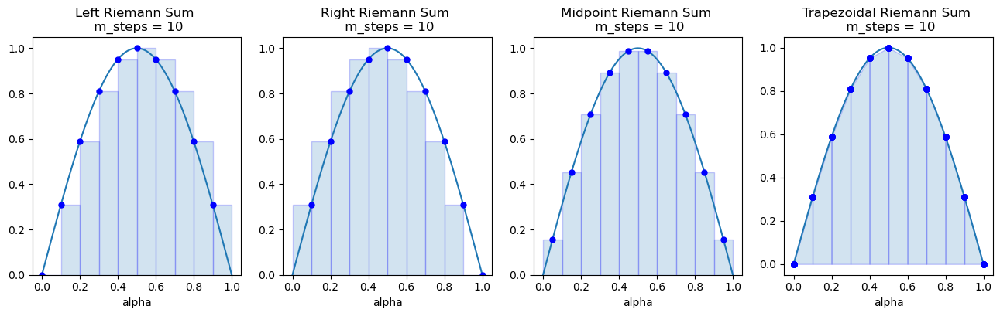

In [159]:
_ = plot_riemann_sums(lambda x: tf.math.sin(x*math.pi), 0.0, 1.0, m_steps=10)

In [160]:
def generate_alphas(m_steps=50,
                      method='riemann_trapezoidal'):
    """
    Args:
      m_steps(Tensor): A 0D tensor of an int corresponding to the number of linear
        interpolation steps for computing an approximate integral. Default is 50.
      method(str): A string representing the integral approximation method. The 
        following methods are implemented:
        - riemann_trapezoidal(default)
        - riemann_left
        - riemann_midpoint
        - riemann_right
    Returns:
      alphas(Tensor): A 1D tensor of uniformly spaced floats with the shape 
        (m_steps,).
    """
    m_steps_float = tf.cast(m_steps, float) # cast to float for division operations.

    if method == 'riemann_trapezoidal':
        alphas = tf.linspace(0.0, 1.0, m_steps+1) # needed to make m_steps intervals.
    elif method == 'riemann_left':
        alphas = tf.linspace(0.0, 1.0 - (1.0 / m_steps_float), m_steps)
    elif method == 'riemann_midpoint':
        alphas = tf.linspace(1.0 / (2.0 * m_steps_float), 1.0 - 1.0 / (2.0 * m_steps_float), m_steps)
    elif method == 'riemann_right':    
        alphas = tf.linspace(1.0 / m_steps_float, 1.0, m_steps)
    else:
        raise AssertionError("Provided Riemann approximation method is not valid.")
    return alphas

In [161]:
alphas = generate_alphas(m_steps=20, method='riemann_trapezoidal')
alphas.shape

TensorShape([21])

In [162]:
def integral_approximation(gradients, 
                             method='riemann_trapezoidal'):
    """Compute numerical approximation of integral from gradients.

    Args:
      gradients(Tensor): A 4D tensor of floats with the shape 
        (m_steps, img_height, img_width, 3).
      method(str): A string representing the integral approximation method. The 
        following methods are implemented:
        - riemann_trapezoidal(default)
        - riemann_left
        - riemann_midpoint
        - riemann_right 
    Returns:
      integrated_gradients(Tensor): A 3D tensor of floats with the shape
        (img_height, img_width, 3).
    """
    if method == 'riemann_trapezoidal':  
        grads = (gradients[:-1] + gradients[1:]) / tf.constant(2.0)
    elif method == 'riemann_left':
        grads = gradients
    elif method == 'riemann_midpoint':
        grads = gradients
    elif method == 'riemann_right':    
        grads = gradients
    else:
        raise AssertionError("Provided Riemann approximation method is not valid.")

    # Average integration approximation.
    integrated_gradients = tf.math.reduce_mean(grads, axis=0)

    return integrated_gradients

In [164]:
ig = integral_approximation(gradients=path_gradients,
                            method='riemann_trapezoidal')
ig.shape

TensorShape([224, 224, 3])

In [166]:
@tf.function
def integrated_gradients(model,
                         baseline, 
                         input,  
                         target_class_idx,
                         m_steps=50,
                         method='riemann_trapezoidal',
                         batch_size=32
                         ):
    """
    Args:
        model(keras.Model): A trained model to generate predictions and inspect.
        baseline(Tensor): A 3D image tensor with the shape 
        (image_height, image_width, 3) with the same shape as the input tensor.
        input(Tensor): A 3D image tensor with the shape 
        (image_height, image_width, 3).
        target_class_idx(Tensor): An integer that corresponds to the correct 
        ImageNet class index in the model's output predictions tensor. Default 
            value is 50 steps.           
        m_steps(Tensor): A 0D tensor of an integer corresponding to the number of 
        linear interpolation steps for computing an approximate integral.
        method(str): A string representing the integral approximation method. The 
        following methods are implemented:
        - riemann_trapezoidal(default)
        - riemann_left
        - riemann_midpoint
        - riemann_right
        batch_size(Tensor): A 0D tensor of an integer corresponding to a batch
        size for alpha to scale computation and prevent OOM errors. Note: needs to
        be tf.int64 and shoud be < m_steps. Default value is 32.      
    Returns:
        integrated_gradients(Tensor): A 3D tensor of floats with the same 
        shape as the input tensor (image_height, image_width, 3).
    """

    # 1. Generate alphas.
    alphas = generate_alphas(m_steps=m_steps,
                             method=method)

    # Initialize TensorArray outside loop to collect gradients. Note: this data structure
    # is similar to a Python list but more performant and supports backpropogation.
    # See https://www.tensorflow.org/api_docs/python/tf/TensorArray for additional details.
    gradient_batches = tf.TensorArray(tf.float32, size=m_steps+1)

    # Iterate alphas range and batch computation for speed, memory efficiency, and scaling to larger m_steps.
    # Note: this implementation opted for lightweight tf.range iteration with @tf.function.
    # Alternatively, you could also use tf.data, which adds performance overhead for the IG 
    # algorithm but provides more functionality for working with tensors and image data pipelines.
    for alpha in tf.range(0, len(alphas), batch_size):
        from_ = alpha
        to = tf.minimum(from_ + batch_size, len(alphas))
        alpha_batch = alphas[from_:to]

        # 2. Generate interpolated inputs between baseline and input.
        interpolated_path_input_batch = generate_path_inputs(baseline=baseline,
                                                             input=input,
                                                             alphas=alpha_batch)

        # 3. Compute gradients between model outputs and interpolated inputs.
        gradient_batch = compute_gradients(model=model,
                                           path_inputs=interpolated_path_input_batch,
                                           target_class_idx=target_class_idx)
        
        # Write batch indices and gradients to TensorArray. Note: writing batch indices with
        # scatter() allows for uneven batch sizes. Note: this operation is similar to a Python list extend().
        # See https://www.tensorflow.org/api_docs/python/tf/TensorArray#scatter for additional details.
        gradient_batches = gradient_batches.scatter(tf.range(from_, to), gradient_batch)    
    
    # Stack path gradients together row-wise into single tensor.
    total_gradients = gradient_batches.stack()
        
    # 4. Integral approximation through averaging gradients.
    avg_gradients = integral_approximation(gradients=total_gradients,
                                           method=method)
        
    # 5. Scale integrated gradients with respect to input.
    integrated_gradients = (input - baseline) * avg_gradients

    return integrated_gradients

In [167]:
ig_attributions = integrated_gradients(model=inception_v1_classifier,
                                       baseline=name_baseline_tensors['Baseline Image: Black'],
                                       input=img_name_tensors['Giant Panda'],
                                       target_class_idx=389,
                                       m_steps=55,
                                       method='riemann_trapezoidal')

2023-08-14 15:33:09.883890: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


In [168]:
ig_attributions.shape

TensorShape([224, 224, 3])

In [169]:
def convergence_check(model, attributions, baseline, input, target_class_idx):
    """
    Args:
      model(keras.Model): A trained model to generate predictions and inspect.
      baseline(Tensor): A 3D image tensor with the shape 
        (image_height, image_width, 3) with the same shape as the input tensor.
      input(Tensor): A 3D image tensor with the shape 
        (image_height, image_width, 3).
      target_class_idx(Tensor): An integer that corresponds to the correct 
        ImageNet class index in the model's output predictions tensor. Default 
          value is 50 steps.   
    Returns:
      (none): Prints scores and convergence delta to sys.stdout.
    """
    # Your model's prediction on the baseline tensor. Ideally, the baseline score
    # should be close to zero.
    baseline_prediction = model(tf.expand_dims(baseline, 0))
    baseline_score = tf.nn.softmax(tf.squeeze(baseline_prediction))[target_class_idx]
    # Your model's prediction and score on the input tensor.
    input_prediction = model(tf.expand_dims(input, 0))
    input_score = tf.nn.softmax(tf.squeeze(input_prediction))[target_class_idx]
    # Sum of your IG prediction attributions.
    ig_score = tf.math.reduce_sum(attributions)
    delta = ig_score - (input_score - baseline_score)
    try:
        # Test your IG score is <= 5% of the input minus baseline score.
        tf.debugging.assert_near(ig_score, (input_score - baseline_score), rtol=0.05)
        tf.print('Approximation accuracy within 5%.', output_stream=sys.stdout)
    except tf.errors.InvalidArgumentError:
        tf.print('Increase or decrease m_steps to increase approximation accuracy.', output_stream=sys.stdout)
    
    tf.print('Baseline score: {:.3f}'.format(baseline_score))
    tf.print('Input score: {:.3f}'.format(input_score))
    tf.print('IG score: {:.3f}'.format(ig_score))     
    tf.print('Convergence delta: {:.3f}'.format(delta))

In [170]:
convergence_check(model=inception_v1_classifier,
                  attributions=ig_attributions, 
                  baseline=name_baseline_tensors['Baseline Image: Black'], 
                  input=img_name_tensors['Giant Panda'], 
                  target_class_idx=389)

Approximation accuracy within 5%.
Baseline score: 0.000
Input score: 0.894
IG score: 0.910
Convergence delta: 0.016


In [171]:
def plot_img_attributions(model,
                          baseline,                          
                          img,  
                          target_class_idx,
                          m_steps=50,                           
                          cmap=None,
                          overlay_alpha=0.4):
    """
    Args:
      model(keras.Model): A trained model to generate predictions and inspect.
      baseline(Tensor): A 3D image tensor with the shape 
        (image_height, image_width, 3) with the same shape as the input tensor.
      img(Tensor): A 3D image tensor with the shape 
        (image_height, image_width, 3).
      target_class_idx(Tensor): An integer that corresponds to the correct 
        ImageNet class index in the model's output predictions tensor. Default 
          value is 50 steps.
      m_steps(Tensor): A 0D tensor of an integer corresponding to the number of 
        linear interpolation steps for computing an approximate integral.
      cmap(matplotlib.cm): Defaults to None. Reference for colormap options -
        https://matplotlib.org/3.2.1/tutorials/colors/colormaps.html. Interesting
        options to try are None and high contrast 'inferno'.
      overlay_alpha(float): A float between 0 and 1 that represents the intensity
        of the original image overlay.    
    Returns:
      fig(matplotlib.pyplot.figure): fig object to utilize for displaying, saving 
        plots.
    """
    # Attributions
    ig_attributions = integrated_gradients(model=model,
                            baseline=baseline,
                            input=img,
                            target_class_idx=target_class_idx,
                            m_steps=m_steps)

    convergence_check(model, ig_attributions, baseline, img, target_class_idx)
    
    # Per the original paper, take the absolute sum of the attributions across 
    # color channels for visualization. The attribution mask shape is a greyscale image
    # with shape (224, 224).
    attribution_mask = tf.reduce_sum(tf.math.abs(ig_attributions), axis=-1)

    # Visualization
    fig, axs = plt.subplots(nrows=2, ncols=2, squeeze=False, figsize=(8, 8))

    axs[0,0].set_title('Baseline Image')
    axs[0,0].imshow(baseline)
    axs[0,0].axis('off')

    axs[0,1].set_title('Original Image')
    axs[0,1].imshow(img)
    axs[0,1].axis('off') 

    axs[1,0].set_title('IG Attribution Mask')
    axs[1,0].imshow(attribution_mask, cmap=cmap)
    axs[1,0].axis('off')  

    axs[1,1].set_title('Original + IG Attribution Mask Overlay')
    axs[1,1].imshow(attribution_mask, cmap=cmap)
    axs[1,1].imshow(img, alpha=overlay_alpha)
    axs[1,1].axis('off')

    plt.tight_layout()

    return fig

2023-08-14 15:34:49.303474: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


Approximation accuracy within 5%.
Baseline score: 0.000
Input score: 0.326
IG score: 0.326
Convergence delta: 0.001


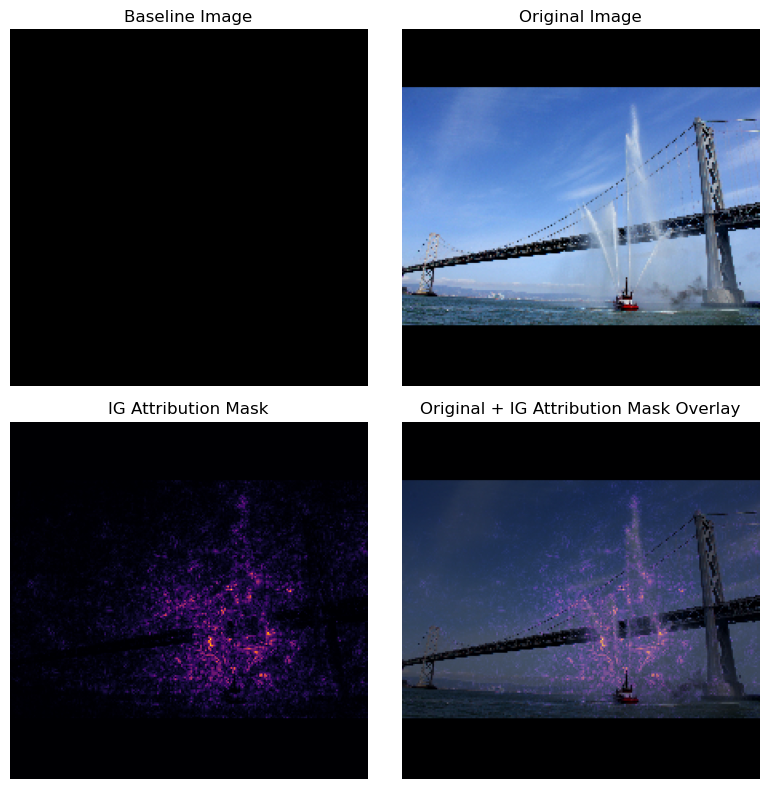

In [172]:
_ = plot_img_attributions(model=inception_v1_classifier,
                          img=img_name_tensors['Fireboat'],
                          baseline=name_baseline_tensors['Baseline Image: Black'],                          
                          target_class_idx=555,
                          m_steps=240,
                          cmap=plt.cm.inferno,
                          overlay_alpha=0.4)

Approximation accuracy within 5%.
Baseline score: 0.000
Input score: 0.894
IG score: 0.910
Convergence delta: 0.016


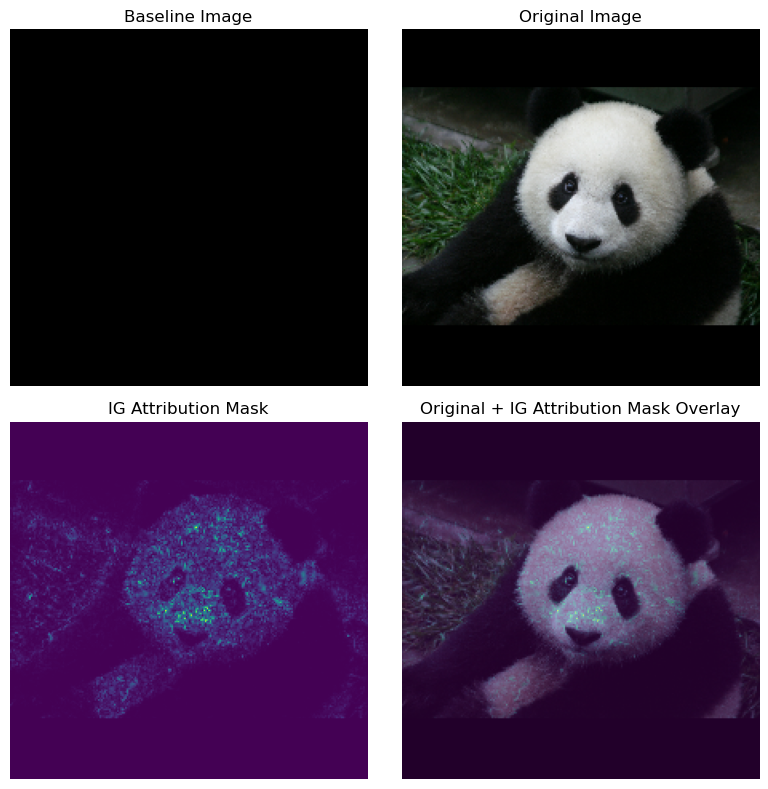

In [175]:
_ = plot_img_attributions(model=inception_v1_classifier,
                          img=img_name_tensors['Giant Panda'],
                          baseline=name_baseline_tensors['Baseline Image: Black'],                          
                          target_class_idx=389,
                          m_steps=55,
                          cmap=None,
                          overlay_alpha=0.5)

Approximation accuracy within 5%.
Baseline score: 0.000
Input score: 0.326
IG score: 0.326
Convergence delta: -0.000


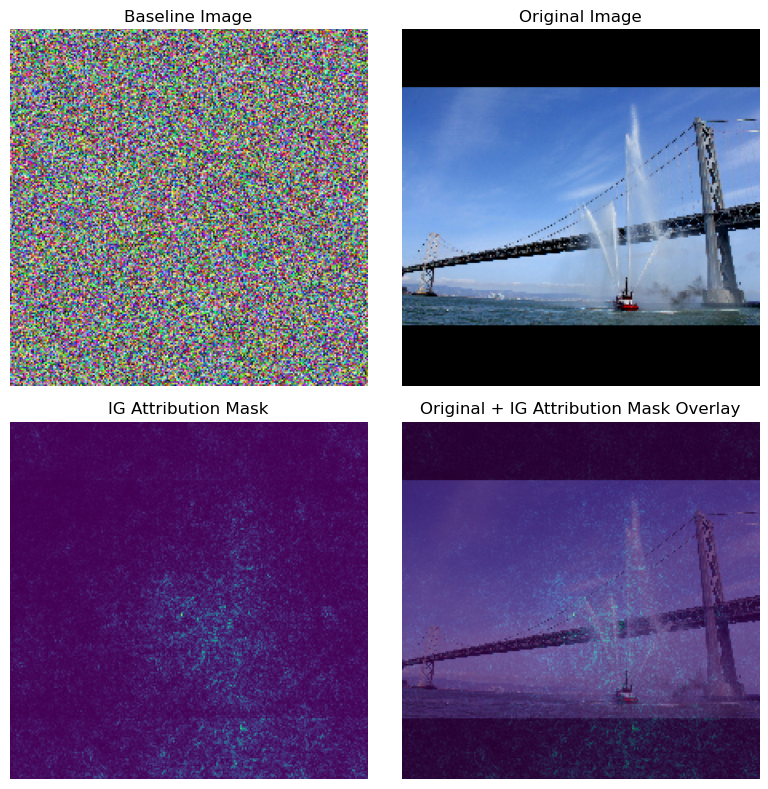

In [188]:
_ = plot_img_attributions(model=inception_v1_classifier,
                          img=img_name_tensors['Fireboat'],
                          baseline=name_baseline_tensors['Baseline Image: Random'],                          
                          target_class_idx=555,
                          m_steps=240,
                          cmap=None,
                          overlay_alpha=0.4)

2023-08-14 15:38:12.639571: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


Approximation accuracy within 5%.
Baseline score: 0.000
Input score: 0.765
IG score: 0.788
Convergence delta: 0.023


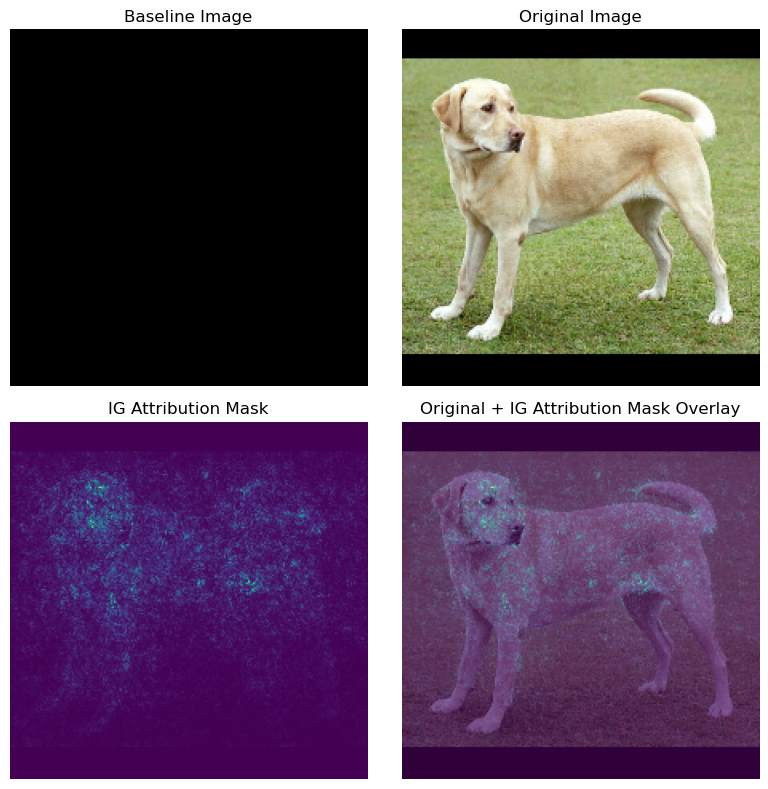

In [180]:
_ = plot_img_attributions(model=inception_v1_classifier,
                          img=img_name_tensors['Yellow Labrador Retriever'],
                          baseline=name_baseline_tensors['Baseline Image: Black'],                          
                          target_class_idx=209,
                          m_steps=100,
                          cmap=None,
                          overlay_alpha=0.3)

2023-08-14 15:38:49.392117: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


Approximation accuracy within 5%.
Baseline score: 0.001
Input score: 0.355
IG score: 0.351
Convergence delta: -0.003


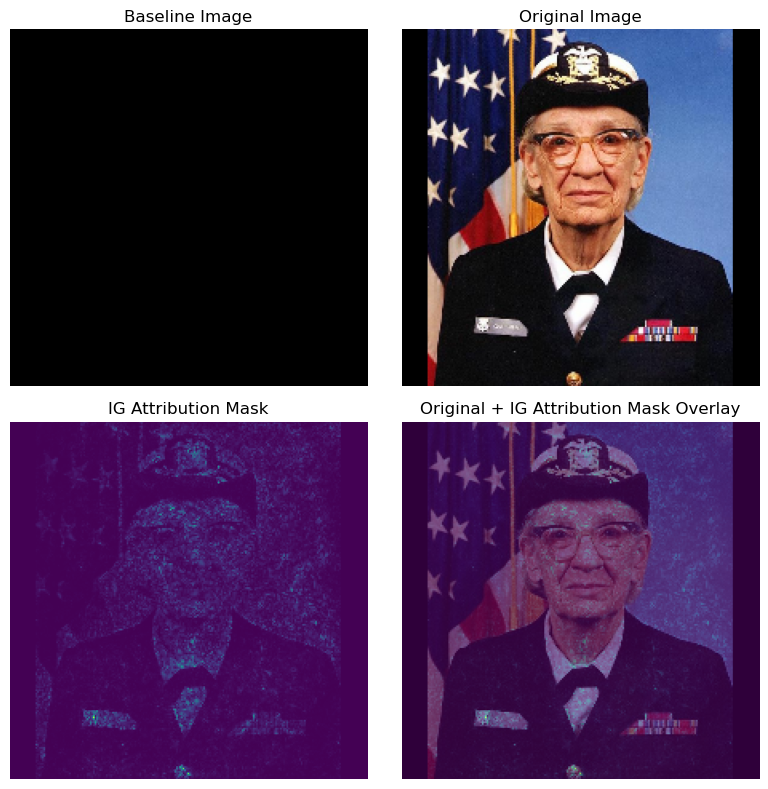

In [181]:
_ = plot_img_attributions(model=inception_v1_classifier,
                          img=img_name_tensors['Military Uniform (Grace Hopper)'],
                          baseline=name_baseline_tensors['Baseline Image: Black'],                          
                          target_class_idx=653,
                          m_steps=200,
                          cmap=None,
                          overlay_alpha=0.3)

In [182]:
rotate90_labrador_retriever_img = tf.image.rot90(img_name_tensors['Yellow Labrador Retriever'])
upsidedown_labrador_retriever_img = tf.image.flip_up_down(img_name_tensors['Yellow Labrador Retriever'])
zoom_labrador_retriever_img = tf.keras.preprocessing.image.random_zoom(x=img_name_tensors['Yellow Labrador Retriever'], zoom_range=(0.45,0.45))

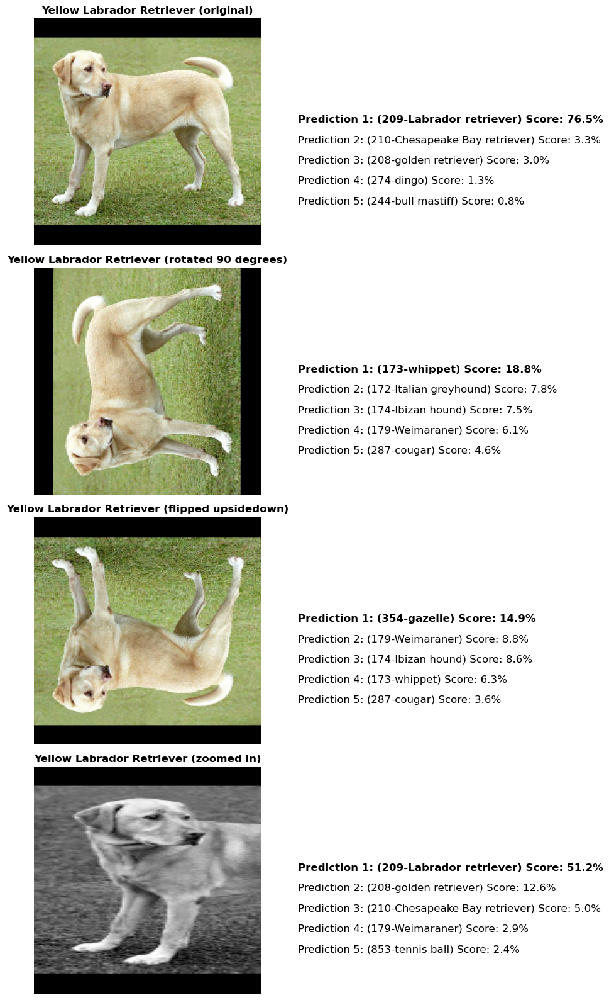

In [183]:
_ = plot_img_predictions(
    model=inception_v1_classifier,
    img=tf.stack([img_name_tensors['Yellow Labrador Retriever'],
                  rotate90_labrador_retriever_img, 
                  upsidedown_labrador_retriever_img,
                  zoom_labrador_retriever_img]),
    img_titles=tf.stack(['Yellow Labrador Retriever (original)',
                         'Yellow Labrador Retriever (rotated 90 degrees)',
                         'Yellow Labrador Retriever (flipped upsidedown)',
                         'Yellow Labrador Retriever (zoomed in)']),
    label_vocab=imagenet_label_vocab, 
    top_k=5
    )

In [184]:
labrador_retriever_attributions = integrated_gradients(model=inception_v1_classifier,
                          baseline=name_baseline_tensors['Baseline Image: Black'],
                          input=img_name_tensors['Yellow Labrador Retriever'],
                          target_class_idx=209,
                          m_steps=200,
                          method='riemann_trapezoidal')

zoom_labrador_retriever_attributions = integrated_gradients(model=inception_v1_classifier,
                          baseline=name_baseline_tensors['Baseline Image: Black'],
                          input=zoom_labrador_retriever_img,
                          target_class_idx=209,
                          m_steps=200,
                          method='riemann_trapezoidal')

2023-08-14 15:41:04.462572: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


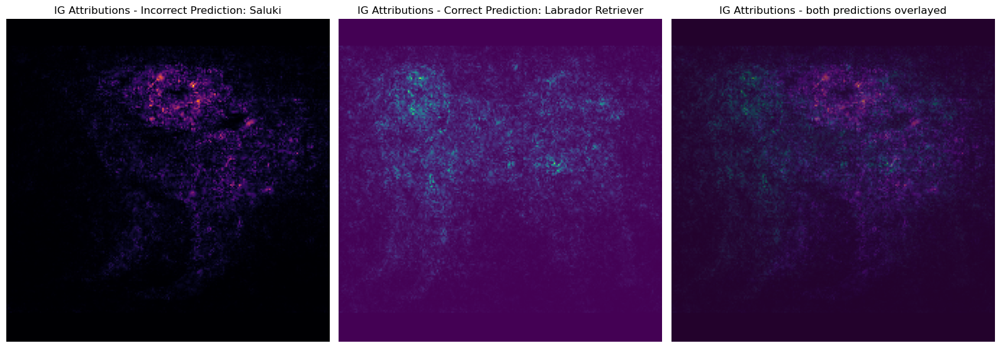

In [185]:
fig, axs = plt.subplots(nrows=1, ncols=3, squeeze=False, figsize=(16, 12))

axs[0,0].set_title('IG Attributions - Incorrect Prediction: Saluki')
axs[0,0].imshow(tf.reduce_sum(tf.abs(zoom_labrador_retriever_attributions), axis=-1), cmap=plt.cm.inferno)
axs[0,0].axis('off')

axs[0,1].set_title('IG Attributions - Correct Prediction: Labrador Retriever')
axs[0,1].imshow(tf.reduce_sum(tf.abs(labrador_retriever_attributions), axis=-1), cmap=None)
axs[0,1].axis('off')

axs[0,2].set_title('IG Attributions - both predictions overlayed')
axs[0,2].imshow(tf.reduce_sum(tf.abs(zoom_labrador_retriever_attributions), axis=-1), cmap=plt.cm.inferno, alpha=0.99)
axs[0,2].imshow(tf.reduce_sum(tf.abs(labrador_retriever_attributions), axis=-1), cmap=None, alpha=0.5)
axs[0,2].axis('off')

plt.tight_layout();

In [190]:
th.tf_utils?

Type:        module
String form: <module 'tensorflow_hub.tf_utils' from '/opt/homebrew/Caskroom/miniforge/base/envs/im-torch/lib/python3.11/site-packages/tensorflow_hub/tf_utils.py'>
File:        /opt/homebrew/Caskroom/miniforge/base/envs/im-torch/lib/python3.11/site-packages/tensorflow_hub/tf_utils.py
Docstring:   Replicates TensorFlow utilities which are not part of the public API.